# 사전 설정


## 과제 요약

이번 미션에서는 SSD 모델을 활용하여 개와 고양이의 얼굴(Face) 영역을 감지하는 Object Detection 작업을 수행해 봅시다.

- [데이터 링크](https://www.kaggle.com/datasets/devdgohil/the-oxfordiiit-pet-dataset) (The Oxford-IIIT Pet Dataset)

- annotations(xml): 각 이미지 파일에 대한 annotation
- images: 이미지 파일(37종의 개와 고양이)

## 라이브러리 설치 및 import

In [ ]:
# @title 기본 라이브러리 import
import os
import sys
import math
import glob
import random
import shutil
import xml.etree.ElementTree as ET

import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from PIL import Image, ImageEnhance, ImageFilter

from tqdm import tqdm
from sklearn.metrics import average_precision_score, classification_report

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torch.utils.data.sampler import WeightedRandomSampler

import torchvision
import torchvision.models as models
import torchvision.transforms.functional as F2
import torchvision.transforms.v2 as v2
from torchvision import transforms
from torchvision.models.detection.ssd import SSD300_VGG16_Weights
from torchinfo import summary

import json
import kagglehub
import pickle

In [4]:
# @title Google drive 연결
# from google.colab import drive
# drive.mount('/content/drive')
# g_path  = "/content/drive/MyDrive/Colab Notebooks/data"
g_path = './data'
os.makedirs(g_path, exist_ok=True)

In [5]:
# @title GPU 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


---

# SSD 실험

## 1. 데이터 탐색 및 불러오기

In [ ]:
# @title 데이터 다운로드

path = 'C:/projec'
print("Path to dataset files:", path)


Path to dataset files: C:/projec


In [ ]:
# @title 데이터 수량 확인

# 경로 설정 및 파일 수량확인
test_img_path = os.path.join(path, "test_images")
train_img_path = os.path.join(path, "train_images")

print(f"테스트 이미지 파일 개수: {len(os.listdir(test_img_path))}")
print(f"학습 이미지 파일 개수: {len(os.listdir(train_img_path))}")

count_dic = {}

img_list = os.listdir(train_img_path)

medi_set = set()
for name in img_list:
    name_list = name[:-23].split('-')[1:]
    for medi_name in name_list:
        medi_set.add(f'K-{medi_name}')
print(f'알약 종류 개수: {len(medi_set)}')

테스트 이미지 파일 개수: 843
학습 이미지 파일 개수: 3815
알약 종류 개수: 73


## 데이터 확인

In [ ]:
# @title json 구조 확인

import json

path = 'C:/projec'
anno_path = os.path.join(path, 'final_annotations.json')

with open(anno_path, 'r', encoding='utf-8') as f:
    data = json.load(f)


def print_json_tree(data, indent=""):
    # dict 형태인 경우
    if isinstance(data, dict):
        for key, value in data.items():
            print(f"{indent}{key}:")
            print_json_tree(value, indent + "  ")

    # list 형태인 경우
    elif isinstance(data, list):
        for idx, item in enumerate(data):
            print(f"{indent}[{idx}]:")
            print_json_tree(item, indent + "  ")

    # 값(int, float, str, bool, None)인 경우
    else:
        print(f"{indent}{data}")

print_json_tree(data)

images:
  [0]:
    file_name:
      K-001900-016548-018110-021026_0_2_0_2_70_000_200.png
    width:
      976
    height:
      1280
    imgfile:
      K-001900-016548-018110-021026_0_2_0_2_70_000_200.png
    drug_N:
      K-001900
    drug_S:
      정상알약
    back_color:
      연회색 배경
    drug_dir:
      앞면
    light_color:
      주백색
    camera_la:
      70
    camera_lo:
      0
    size:
      200
    dl_idx:
      1899
    dl_mapping_code:
      K-001900
    dl_name:
      보령부스파정 5mg
    dl_name_en:
      Buspar Tab. 5mg Boryung
    img_key:
      http://connectdi.com/design/img/drug/1Mxwka5v0lL.jpg
    dl_material:
      부스피론염산염
    dl_material_en:
      Buspirone Hydrochloride
    dl_custom_shape:
      정제, 저작정
    dl_company:
      보령제약(주)
    dl_company_en:
      Boryung
    di_company_mf:
      
    di_company_mf_en:
      
    item_seq:
      198700706
    di_item_permit_date:
      19870323
    di_class_no:
      [01170]정신신경용제
    di_etc_otc_code:
      전문의약품
    di_edi_code:
 

K-001900-016548-018110-021026_0_2_0_2_70_000_200.png


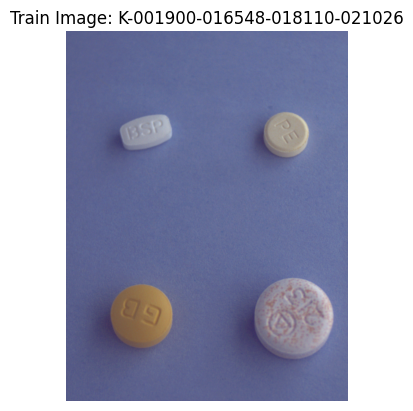

K-001900-016548-018110-021026_0_2_0_2_75_000_200.png


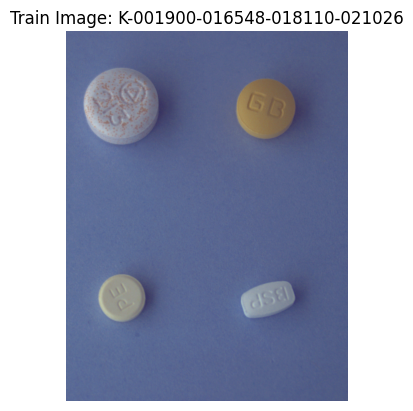

K-001900-016548-018110-027926_0_2_0_2_75_000_200.png


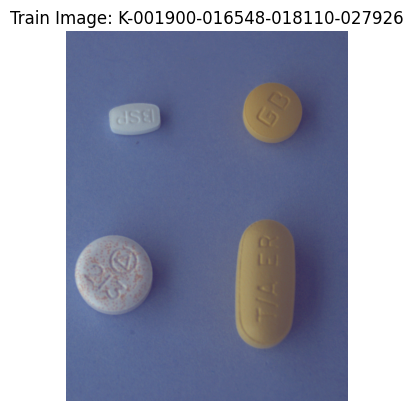

In [14]:
# @title 데이터 샘플 확인
for i in range(3):
    path_1 = os.listdir(train_img_path)[i]
    print(path_1)

    train_image_path = os.path.join(train_img_path, f"{path_1}")

    train_image = cv2.imread(train_image_path)
    train_image = cv2.cvtColor(train_image, cv2.COLOR_BGR2RGB)

    plt.imshow(train_image)
    plt.title(f"Train Image: {path_1[:-23]}")
    plt.axis("off")
    plt.show()

---

## 2. 데이터 전처리

In [ ]:
# @title XML-이미지 Pair가 없는 데이터 제거

# splitext -->  a.jpg -> ["a", ".jpg"]
img_list = set([os.path.splitext(file)[0] for file in os.listdir(train_img_path) if file.endswith(".png")])
print(f'train 이미지 개수: {len(img_list)}')

name_list = []
with open(anno_path, 'r', encoding='utf-8') as f:
    data = json.load(f)
for i in data['images']:
    name_list.append(i['file_name'][:-4])
            
json_list = set(name_list)
print(f'json 종류 개수: {len(json_list)}\n')

# 이미지가 없는 json 목록
extra_json = [json for json in json_list if json not in img_list]
print(f"이미지가 없는 json 개수: {len(extra_json)}")
print(extra_json)

# json이 없는 이미지 목록
missing_xml = [image for image in img_list if image not in json_list]
print(f"json이 없는 이미지 개수: {len(missing_xml)}")
print(missing_xml)

# 짝이 안 맞는 데이터는 drop
trainval_list = [image for image in img_list if image in json_list]
json_list = [xml for xml in json_list if xml in trainval_list]

print("=====================================================")
print(f"최종 학습 데이터 수: {len(trainval_list)}")
print(f"최종 json 파일 개수: {len(json_list)}")

paired_list = list(set(trainval_list + json_list))
print("짝이 맞는 데이터 개수: ",len(paired_list))

train 이미지 개수: 3815
json 종류 개수: 3815

이미지가 없는 json 개수: 0
[]
json이 없는 이미지 개수: 0
[]
최종 학습 데이터 수: 3815
최종 json 파일 개수: 3815
짝이 맞는 데이터 개수:  3815


### **객체 Bounding Box 리스트화**

In [23]:
import pandas as pd
from collections import Counter
from pathlib import Path

with open(anno_path, 'r', encoding='utf-8') as f:
    data = json.load(f)

def get_classes_count(data):

    counter = Counter()
    for ann in data["annotations"]:
        counter[int(ann["category_id"])] += 1

    # 클래스별 개수 추출
    classes_count = {cls_id: cnt for cls_id, cnt in counter.items()}
    
    return classes_count

if __name__ == "__main__":
    classes_count = get_classes_count(data)
    print(classes_count)

{1899: 216, 16547: 225, 18109: 182, 21025: 203, 27925: 202, 29344: 210, 29450: 175, 31704: 196, 33008: 201, 19606: 219, 21770: 189, 24849: 198, 33207: 198, 44198: 210, 16550: 192, 2482: 212, 3742: 203, 4377: 215, 6191: 214, 12777: 207, 19551: 186, 22626: 210, 23222: 195, 5885: 214, 12080: 197, 13394: 208, 22361: 198, 5093: 199, 25437: 209, 3350: 265, 3831: 219, 16231: 204, 16261: 227, 16687: 228, 20237: 231, 21324: 215, 22073: 187, 29666: 235, 35205: 226, 36636: 219, 38161: 207, 13899: 183, 18356: 201, 19231: 206, 20013: 208, 31862: 216, 32309: 199, 33879: 215, 41767: 183, 18146: 201, 3482: 255, 19860: 223, 34596: 185, 20876: 210, 25366: 237, 28762: 193, 30307: 208, 31884: 210, 22346: 191, 25468: 209, 27732: 224, 27776: 181, 27652: 222, 3543: 191, 4542: 223, 10220: 210, 12246: 192, 12419: 190, 23202: 215, 27992: 206, 29870: 185, 33877: 187, 6562: 205}


## 4. 데이터셋 + 데이터로더 생성

## 5. YOLOv8

In [ ]:
import os
import json
import shutil
import random
from tqdm import tqdm

# ======================================================
# 설정 (필요시 수정)
# ======================================================
OUTPUT_DIR    = "dataset_yolo_f/"    # YOLO 출력 폴더
SPLIT_RATIO   = 0.8                # train 80%, val 20%
IMG_EXT       = [".png"]
# ======================================================



def convert_bbox(bbox, img_w, img_h):
    x, y, w, h = bbox

    cx = x + w / 2
    cy = y + h / 2

    return cx / img_w, cy / img_h, w / img_w, h / img_h





def main():
    all_images = []
    all_annos = []
    category_set = set()

    # JSON 병합          
    with open(anno_path, 'r', encoding='utf-8') as f:
        data = json.load(f)
        for ann in data["annotations"]:
            all_annos.append(ann)
            category_set.add(ann["category_id"]) # 약 종류 코드
        for img in data["images"]:
            all_images.append(img)

    # 카테고리 매핑
    category_list = sorted(list(category_set))
    cat_to_idx = {cat_id: idx for idx, cat_id in enumerate(category_list)}
    print(f"[INFO] 카테고리 {len(category_list)}개 변환 완료")

    # train/val split
    random.seed(42)
    random.shuffle(all_images)
    split_idx = int(len(all_images) * SPLIT_RATIO) # 0.8
    train_images = all_images[:split_idx]
    val_images = all_images[split_idx:]
    print(f"[INFO] Train: {len(train_images)}, Val: {len(val_images)}")

    # 폴더 생성
    for p in ["images/train", "images/val","labels/train", "labels/val"]:
        os.makedirs(os.path.join(OUTPUT_DIR, p), exist_ok=True)

    # 이미지 id → annotation 그룹핑
    anno_by_img = {}
    for ann in all_annos:
        img_id = ann["image_id"]
        if img_id not in anno_by_img:
            anno_by_img[img_id] = []
        anno_by_img[img_id].append(ann)
        
    print("변환 시작")

    # train 변환
    for img in tqdm(train_images):
        img_name = img["file_name"]
        img_path = os.path.join(train_img_path, img_name)

        # 이미지 복사
        shutil.copy(img_path, os.path.join(OUTPUT_DIR, "images/train", img_name))

        # 라벨 저장
        if img["id"] in anno_by_img:
            w, h = img["width"], img["height"]
            with open(os.path.join(OUTPUT_DIR, "labels/train", img_name.replace(os.path.splitext(img_name)[1], ".txt")), "w") as f:
                for ann in anno_by_img[img["id"]]:
                    cls_id = cat_to_idx[ann["category_id"]]
                    bbox = convert_bbox(ann["bbox"], w, h)
                    f.write(f"{cls_id} {bbox[0]:.6f} {bbox[1]:.6f} {bbox[2]:.6f} {bbox[3]:.6f}\n")

    # val 변환
    for img in tqdm(val_images):
        img_name = img["file_name"]
        img_path = os.path.join(train_img_path, img_name)

        shutil.copy(img_path, os.path.join(OUTPUT_DIR, "images/val", img_name))

        if img["id"] in anno_by_img:
            w, h = img["width"], img["height"]
            with open(os.path.join(OUTPUT_DIR, "labels/val", img_name.replace(os.path.splitext(img_name)[1], ".txt")), "w") as f:
                for ann in anno_by_img[img["id"]]:
                    cls_id = cat_to_idx[ann["category_id"]]
                    bbox = convert_bbox(ann["bbox"], w, h)
                    f.write(f"{cls_id} {bbox[0]:.6f} {bbox[1]:.6f} {bbox[2]:.6f} {bbox[3]:.6f}\n")
                    

    # data.yaml 생성
    yaml_path = os.path.join(OUTPUT_DIR, "data.yaml")
    with open(yaml_path, "w") as f:
        f.write(f"path: C:/Users/main/Downloads/{OUTPUT_DIR}\n")
        f.write("train: images/train\nval: images/val\n")
        f.write("names:\n")
        for k, v in cat_to_idx.items():
            f.write(f"  {v}: class_{k}\n")

    print(f"[완료] 변환 완료 → {OUTPUT_DIR}")
    print(f"[생성] data.yaml → {yaml_path}")

if __name__ == "__main__":
    main()


[INFO] 카테고리 73개 변환 완료
[INFO] Train: 3052, Val: 763
변환 시작


100%|██████████| 763/763 [00:00<00:00, 937.89it/s]

[완료] 변환 완료 → dataset_yolo_f/
[생성] data.yaml → dataset_yolo_f/data.yaml


In [26]:
import os
import shutil

test_dest_dir   = "dataset_yolo_f/images/test"           # YOLO test 폴더
IMG_EXT = [".png"]

os.makedirs(test_dest_dir, exist_ok=True)

for file in os.listdir(test_img_path):
    if os.path.splitext(file)[1].lower() in IMG_EXT:
        shutil.copy(
            os.path.join(test_img_path, file),
            os.path.join(test_dest_dir, file)
        )

print(f"✅ Test 이미지 복사 완료 → {test_dest_dir}")

✅ Test 이미지 복사 완료 → dataset_yolo_f/images/test


In [1]:
from ultralytics import YOLO

# 1) 모델 불러오기 (기본 nano)
model = YOLO("yolov8n.pt")

hyp = {
    "hsv_h": 0,
    "hsv_s": 0,
    "hsv_v": 0.5,
    "mosaic": 1.0,
    "mixup": 0.1,
    "fliplr": 0.5,
    "translate": 0.1,
    "scale": 0.5
}


# 2) 학습
model.train(
    data="C:/Users/main/Downloads/dataset_yolo_f/data.yaml",
    # **hyp,
    epochs=200,
    imgsz=640,
    batch=16,
)

New https://pypi.org/project/ultralytics/8.3.221 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.28  Python-3.11.4 torch-2.10.0.dev20251021+cu128 CUDA:0 (NVIDIA GeForce RTX 5070, 12227MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=C:/Users/main/Downloads/dataset_yolo_f/data.yaml, epochs=200, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train78, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retin

train: Scanning C:\Users\main\Downloads\dataset_yolo_f\labels\train.cache... 3052 images, 0 backgrounds, 1 corrupt: 100%|██████████| 3052/3052 [00:00<?, ?it/s]

train: WARNING  C:\Users\main\Downloads\dataset_yolo_f\images\train\K-003351-016262-018357_0_2_0_2_75_000_200.png: ignoring corrupt image/label: non-normalized or out of bounds coordinates [6.887807]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


c:\Users\main\AppData\Local\Programs\Python\Python311\Lib\site-packages\ultralytics\data\augment.py:1850: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),
val: Scanning C:\Users\main\Downloads\dataset_yolo_f\labels\val.cache... 763 images, 0 backgrounds, 0 corrupt: 100%|██████████| 763/763 [00:00<?, ?it/s]


Plotting labels to runs\detect\train78\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00013, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train78
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200       2.5G     0.4509      4.282     0.9001         98        640: 100%|██████████| 191/191 [00:18<00:00, 10.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.84it/s]


                   all        763       3015      0.324      0.172      0.111      0.107

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200       2.5G     0.3082      2.981     0.8746         86        640: 100%|██████████| 191/191 [00:17<00:00, 11.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.02it/s]


                   all        763       3015       0.51      0.679      0.637      0.625

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200       2.5G     0.2762      1.841     0.8657         72        640: 100%|██████████| 191/191 [00:17<00:00, 11.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.24it/s]


                   all        763       3015      0.844      0.894       0.93      0.913

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      2.49G     0.2431      1.232     0.8436         87        640: 100%|██████████| 191/191 [00:16<00:00, 11.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.24it/s]

                   all        763       3015      0.944       0.96       0.98      0.969



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200       2.5G     0.2277     0.9386     0.8333         59        640: 100%|██████████| 191/191 [00:16<00:00, 11.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.27it/s]

                   all        763       3015      0.964      0.979      0.989       0.98



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      2.49G     0.2133     0.7953     0.8284         67        640: 100%|██████████| 191/191 [00:17<00:00, 11.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.37it/s]

                   all        763       3015      0.972      0.989      0.991      0.983



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      2.49G     0.2028     0.7123     0.8259         55        640: 100%|██████████| 191/191 [00:17<00:00, 11.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.15it/s]

                   all        763       3015      0.991      0.991      0.994      0.989



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200       2.5G     0.1981     0.6602     0.8252         68        640: 100%|██████████| 191/191 [00:18<00:00, 10.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.92it/s]

                   all        763       3015       0.99      0.994      0.995      0.989



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200       2.5G     0.1924     0.6195     0.8221         86        640: 100%|██████████| 191/191 [00:17<00:00, 10.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.87it/s]

                   all        763       3015      0.994      0.996      0.995       0.99



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      2.49G     0.1885     0.5838     0.8189         75        640: 100%|██████████| 191/191 [00:18<00:00, 10.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.40it/s]

                   all        763       3015      0.992      0.996      0.995      0.991



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200       2.5G     0.1854     0.5538     0.8188         91        640: 100%|██████████| 191/191 [00:18<00:00, 10.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.57it/s]

                   all        763       3015      0.995      0.997      0.995      0.991



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      2.49G     0.1785     0.5285     0.8164         74        640: 100%|██████████| 191/191 [00:18<00:00, 10.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.36it/s]

                   all        763       3015      0.995      0.997      0.995      0.991



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200       2.5G     0.1771     0.5141     0.8158         84        640: 100%|██████████| 191/191 [00:19<00:00,  9.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.80it/s]

                   all        763       3015      0.995      0.995      0.995       0.99



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200       2.5G     0.1753     0.4983     0.8159         79        640: 100%|██████████| 191/191 [00:17<00:00, 10.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.86it/s]

                   all        763       3015      0.996      0.996      0.995      0.992



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      2.49G     0.1708     0.4814     0.8142         82        640: 100%|██████████| 191/191 [00:17<00:00, 10.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.89it/s]

                   all        763       3015      0.997      0.998      0.995      0.992



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      2.49G     0.1706     0.4679     0.8132         96        640: 100%|██████████| 191/191 [00:17<00:00, 10.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.90it/s]

                   all        763       3015      0.997      0.998      0.995      0.992



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200       2.5G      0.168     0.4564     0.8133         86        640: 100%|██████████| 191/191 [00:17<00:00, 10.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.97it/s]

                   all        763       3015      0.995      0.996      0.995      0.992



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200       2.5G     0.1655     0.4418     0.8103         75        640: 100%|██████████| 191/191 [00:17<00:00, 10.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.60it/s]

                   all        763       3015      0.996      0.997      0.995      0.992



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200       2.5G     0.1683     0.4398     0.8131         52        640: 100%|██████████| 191/191 [00:16<00:00, 11.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.07it/s]

                   all        763       3015      0.996      0.997      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200       2.5G     0.1631      0.417     0.8112         89        640: 100%|██████████| 191/191 [00:16<00:00, 11.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.79it/s]

                   all        763       3015      0.997      0.998      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      2.49G     0.1577     0.4104     0.8087        100        640: 100%|██████████| 191/191 [00:16<00:00, 11.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.97it/s]

                   all        763       3015      0.997      0.999      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      2.49G     0.1589     0.4035     0.8114         92        640: 100%|██████████| 191/191 [00:16<00:00, 11.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.90it/s]

                   all        763       3015      0.997      0.998      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      2.48G     0.1585     0.3968     0.8093         79        640: 100%|██████████| 191/191 [00:16<00:00, 11.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.02it/s]

                   all        763       3015      0.997      0.999      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      2.49G     0.1558     0.3868     0.8101         74        640: 100%|██████████| 191/191 [00:17<00:00, 11.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.92it/s]

                   all        763       3015      0.998      0.999      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      2.49G     0.1572     0.3859      0.811         79        640: 100%|██████████| 191/191 [00:16<00:00, 11.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.64it/s]

                   all        763       3015      0.997      0.998      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      2.48G     0.1551     0.3713     0.8078         82        640: 100%|██████████| 191/191 [00:16<00:00, 11.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.87it/s]

                   all        763       3015      0.997      0.999      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      2.49G     0.1546     0.3663      0.808         75        640: 100%|██████████| 191/191 [00:16<00:00, 11.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.14it/s]

                   all        763       3015      0.997      0.998      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      2.49G      0.154     0.3714     0.8106         83        640: 100%|██████████| 191/191 [00:16<00:00, 11.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.09it/s]

                   all        763       3015      0.997      0.999      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200       2.5G     0.1522     0.3555     0.8077         77        640: 100%|██████████| 191/191 [00:16<00:00, 11.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.14it/s]

                   all        763       3015      0.997      0.998      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      2.48G     0.1498     0.3504     0.8064         77        640: 100%|██████████| 191/191 [00:16<00:00, 11.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.83it/s]

                   all        763       3015      0.998          1      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      2.49G     0.1496     0.3414     0.8072         84        640: 100%|██████████| 191/191 [00:16<00:00, 11.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.16it/s]

                   all        763       3015      0.998      0.999      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      2.49G     0.1467     0.3424     0.8068         84        640: 100%|██████████| 191/191 [00:16<00:00, 11.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.11it/s]

                   all        763       3015      0.998          1      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      2.49G     0.1488     0.3346     0.8058         79        640: 100%|██████████| 191/191 [00:16<00:00, 11.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.07it/s]

                   all        763       3015      0.998      0.999      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      2.49G     0.1498     0.3313     0.8049         60        640: 100%|██████████| 191/191 [00:16<00:00, 11.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.92it/s]

                   all        763       3015      0.998      0.999      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      2.49G     0.1474     0.3248     0.8048         80        640: 100%|██████████| 191/191 [00:17<00:00, 11.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.86it/s]

                   all        763       3015      0.998          1      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      2.49G     0.1486     0.3217     0.8078         66        640: 100%|██████████| 191/191 [00:16<00:00, 11.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.87it/s]

                   all        763       3015      0.997          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      2.49G     0.1449     0.3206     0.8057         90        640: 100%|██████████| 191/191 [00:17<00:00, 11.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.12it/s]

                   all        763       3015      0.998      0.999      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      2.49G     0.1473     0.3112     0.8098         57        640: 100%|██████████| 191/191 [00:16<00:00, 11.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.14it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      2.48G     0.1474     0.3093     0.8076         77        640: 100%|██████████| 191/191 [00:16<00:00, 11.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.19it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      2.48G     0.1422      0.301     0.8081         88        640: 100%|██████████| 191/191 [00:16<00:00, 11.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.99it/s]

                   all        763       3015      0.997      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      2.49G     0.1429      0.304     0.8078         78        640: 100%|██████████| 191/191 [00:16<00:00, 11.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.16it/s]

                   all        763       3015      0.997          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200       2.5G     0.1418     0.2918     0.8055         86        640: 100%|██████████| 191/191 [00:16<00:00, 11.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.09it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      2.49G     0.1414     0.2957     0.8064        102        640: 100%|██████████| 191/191 [00:16<00:00, 11.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.15it/s]

                   all        763       3015      0.997      0.998      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      2.49G     0.1417     0.2918     0.8059         68        640: 100%|██████████| 191/191 [00:16<00:00, 11.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.78it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      2.48G     0.1409     0.2846      0.806         61        640: 100%|██████████| 191/191 [00:17<00:00, 10.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.94it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200       2.5G     0.1418     0.2822     0.8046         73        640: 100%|██████████| 191/191 [00:16<00:00, 11.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.82it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      2.49G     0.1383     0.2797     0.8054         74        640: 100%|██████████| 191/191 [00:16<00:00, 11.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.16it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      2.49G     0.1418     0.2775     0.8069         63        640: 100%|██████████| 191/191 [00:16<00:00, 11.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.11it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200       2.5G     0.1407     0.2748      0.804         78        640: 100%|██████████| 191/191 [00:16<00:00, 11.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.16it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200       2.5G     0.1372     0.2687     0.8046         96        640: 100%|██████████| 191/191 [00:16<00:00, 11.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.13it/s]

                   all        763       3015      0.997      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200       2.5G     0.1378     0.2745     0.8064         81        640: 100%|██████████| 191/191 [00:16<00:00, 11.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.06it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      2.49G     0.1364     0.2642     0.8061         99        640: 100%|██████████| 191/191 [00:16<00:00, 11.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.08it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200       2.5G     0.1338     0.2578     0.8041         60        640: 100%|██████████| 191/191 [00:16<00:00, 11.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.03it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      2.48G     0.1368     0.2578      0.804         96        640: 100%|██████████| 191/191 [00:16<00:00, 11.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.11it/s]

                   all        763       3015      0.998      0.999      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      2.49G     0.1339     0.2533     0.8063         67        640: 100%|██████████| 191/191 [00:16<00:00, 11.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.93it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      2.49G     0.1358      0.254     0.8041         77        640: 100%|██████████| 191/191 [00:16<00:00, 11.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.09it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200       2.5G     0.1336     0.2534     0.8072         69        640: 100%|██████████| 191/191 [00:16<00:00, 11.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.16it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      2.49G     0.1329     0.2478     0.8062         73        640: 100%|██████████| 191/191 [00:16<00:00, 11.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.09it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200       2.5G     0.1343     0.2492     0.8039         79        640: 100%|██████████| 191/191 [00:16<00:00, 11.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.94it/s]

                   all        763       3015      0.997      0.998      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200       2.5G     0.1316     0.2438     0.8021         85        640: 100%|██████████| 191/191 [00:17<00:00, 11.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.98it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      2.49G     0.1308     0.2409     0.8023         91        640: 100%|██████████| 191/191 [00:16<00:00, 11.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.96it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200       2.5G     0.1313       0.24     0.8043         90        640: 100%|██████████| 191/191 [00:17<00:00, 11.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.03it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      2.49G     0.1328     0.2418      0.802         80        640: 100%|██████████| 191/191 [00:17<00:00, 11.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.93it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      2.49G     0.1327     0.2389     0.8038         80        640: 100%|██████████| 191/191 [00:16<00:00, 11.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.91it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      2.49G     0.1304     0.2329     0.8036         71        640: 100%|██████████| 191/191 [00:16<00:00, 11.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.86it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200       2.5G     0.1292     0.2359     0.8032         90        640: 100%|██████████| 191/191 [00:16<00:00, 11.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.00it/s]


                   all        763       3015      0.998      0.999      0.995      0.994

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200       2.5G     0.1279     0.2306      0.802         86        640: 100%|██████████| 191/191 [00:16<00:00, 11.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.23it/s]

                   all        763       3015      0.997          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      2.49G     0.1315     0.2307     0.8013         78        640: 100%|██████████| 191/191 [00:16<00:00, 11.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.74it/s]

                   all        763       3015      0.997      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200       2.5G     0.1301     0.2338     0.8033         67        640: 100%|██████████| 191/191 [00:16<00:00, 11.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.92it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      2.49G      0.128     0.2217     0.8029         90        640: 100%|██████████| 191/191 [00:16<00:00, 11.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.90it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200       2.5G     0.1294     0.2243     0.8027         67        640: 100%|██████████| 191/191 [00:16<00:00, 11.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.93it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200       2.5G     0.1274     0.2225     0.8033         59        640: 100%|██████████| 191/191 [00:16<00:00, 11.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.11it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      2.49G     0.1278     0.2309     0.8024        100        640: 100%|██████████| 191/191 [00:16<00:00, 11.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.26it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      2.49G     0.1272     0.2242     0.8026         84        640: 100%|██████████| 191/191 [00:16<00:00, 11.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.09it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      2.49G      0.127     0.2186     0.8017         64        640: 100%|██████████| 191/191 [00:16<00:00, 11.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.11it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      2.48G      0.128      0.225     0.8036         73        640: 100%|██████████| 191/191 [00:16<00:00, 11.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.05it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      2.49G     0.1256     0.2178     0.8017         75        640: 100%|██████████| 191/191 [00:16<00:00, 11.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.21it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      2.49G     0.1276     0.2215     0.8039         67        640: 100%|██████████| 191/191 [00:17<00:00, 11.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.95it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      2.49G      0.127     0.2194     0.8035        101        640: 100%|██████████| 191/191 [00:16<00:00, 11.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.92it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200       2.5G     0.1236     0.2146     0.8025         69        640: 100%|██████████| 191/191 [00:17<00:00, 11.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.96it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      2.49G      0.125     0.2112     0.8007         73        640: 100%|██████████| 191/191 [00:16<00:00, 11.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.14it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      2.49G     0.1267     0.2144     0.8021         96        640: 100%|██████████| 191/191 [00:16<00:00, 11.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.05it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      2.49G     0.1211     0.2076     0.8007         67        640: 100%|██████████| 191/191 [00:17<00:00, 11.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.03it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200       2.5G     0.1229     0.2084      0.802         80        640: 100%|██████████| 191/191 [00:16<00:00, 11.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.16it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200       2.5G     0.1252     0.2104     0.8039         65        640: 100%|██████████| 191/191 [00:16<00:00, 11.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.19it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200       2.5G     0.1247      0.209     0.8027         83        640: 100%|██████████| 191/191 [00:16<00:00, 11.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.11it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200       2.5G     0.1239     0.2026      0.804         88        640: 100%|██████████| 191/191 [00:16<00:00, 11.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.10it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200       2.5G      0.122     0.2046     0.8012         96        640: 100%|██████████| 191/191 [00:16<00:00, 11.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.15it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200       2.5G     0.1223      0.199     0.8005         73        640: 100%|██████████| 191/191 [00:16<00:00, 11.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.01it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      2.48G     0.1211     0.2021     0.8014         75        640: 100%|██████████| 191/191 [00:16<00:00, 11.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.13it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      2.49G     0.1227     0.2002     0.8027         82        640: 100%|██████████| 191/191 [00:16<00:00, 11.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.11it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      2.49G     0.1224     0.1998     0.8012         81        640: 100%|██████████| 191/191 [00:16<00:00, 11.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.81it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      2.49G     0.1249     0.1983      0.801         65        640: 100%|██████████| 191/191 [00:16<00:00, 11.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.05it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      2.48G      0.122     0.1967     0.8029         79        640: 100%|██████████| 191/191 [00:16<00:00, 11.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.99it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      2.49G     0.1234      0.201     0.8025         87        640: 100%|██████████| 191/191 [00:16<00:00, 11.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.23it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200       2.5G     0.1213     0.1963     0.8015         57        640: 100%|██████████| 191/191 [00:16<00:00, 11.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.20it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      2.49G     0.1194      0.193      0.801         81        640: 100%|██████████| 191/191 [00:16<00:00, 11.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.20it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      2.48G      0.119     0.1937     0.8029         84        640: 100%|██████████| 191/191 [00:16<00:00, 11.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.16it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200       2.5G     0.1203     0.1955     0.8023         90        640: 100%|██████████| 191/191 [00:16<00:00, 11.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.90it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200       2.5G     0.1204     0.1899     0.8021        103        640: 100%|██████████| 191/191 [00:16<00:00, 11.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.18it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      2.48G     0.1198     0.1941     0.8029         84        640: 100%|██████████| 191/191 [00:16<00:00, 11.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.21it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200       2.5G     0.1193     0.1916     0.7995         95        640: 100%|██████████| 191/191 [00:16<00:00, 11.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.11it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      2.49G     0.1197     0.1903     0.8009         85        640: 100%|██████████| 191/191 [00:16<00:00, 11.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.92it/s]

                   all        763       3015      0.997      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      2.49G     0.1189     0.1914     0.8008         89        640: 100%|██████████| 191/191 [00:16<00:00, 11.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.00it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      2.49G     0.1179     0.1907        0.8         91        640: 100%|██████████| 191/191 [00:16<00:00, 11.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.99it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      2.49G     0.1204     0.1885     0.8028         81        640: 100%|██████████| 191/191 [00:16<00:00, 11.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.97it/s]

                   all        763       3015      0.997      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      2.49G     0.1195     0.1859     0.8019         67        640: 100%|██████████| 191/191 [00:16<00:00, 11.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.25it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200       2.5G     0.1173     0.1875     0.7992        101        640: 100%|██████████| 191/191 [00:16<00:00, 11.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.16it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200       2.5G     0.1157     0.1834     0.7985         90        640: 100%|██████████| 191/191 [00:16<00:00, 11.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.13it/s]

                   all        763       3015      0.998          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      2.49G     0.1163     0.1841     0.7995         66        640: 100%|██████████| 191/191 [00:16<00:00, 11.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.95it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      2.49G     0.1211     0.1872     0.8022         96        640: 100%|██████████| 191/191 [00:16<00:00, 11.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.11it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      2.49G     0.1176     0.1819     0.8012         73        640: 100%|██████████| 191/191 [00:16<00:00, 11.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.17it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      2.49G     0.1162     0.1817     0.8009         88        640: 100%|██████████| 191/191 [00:16<00:00, 11.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.09it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      2.48G     0.1151     0.1802     0.8013         70        640: 100%|██████████| 191/191 [00:16<00:00, 11.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.20it/s]

                   all        763       3015      0.998          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      2.49G     0.1156     0.1796     0.8005         74        640: 100%|██████████| 191/191 [00:16<00:00, 11.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.26it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200       2.5G     0.1154     0.1811     0.8005         78        640: 100%|██████████| 191/191 [00:16<00:00, 11.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.07it/s]

                   all        763       3015      0.997      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200       2.5G     0.1161      0.182     0.8014         70        640: 100%|██████████| 191/191 [00:16<00:00, 11.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.18it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      2.49G     0.1163     0.1762      0.801         78        640: 100%|██████████| 191/191 [00:16<00:00, 11.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.07it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      2.48G     0.1143     0.1741     0.7986         73        640: 100%|██████████| 191/191 [00:16<00:00, 11.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.92it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200       2.5G     0.1145     0.1766     0.8015         78        640: 100%|██████████| 191/191 [00:16<00:00, 11.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.14it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      2.49G     0.1149     0.1791     0.7997         80        640: 100%|██████████| 191/191 [00:16<00:00, 11.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.13it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      2.49G     0.1147     0.1755     0.8015         91        640: 100%|██████████| 191/191 [00:16<00:00, 11.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.16it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      2.49G     0.1141      0.173      0.801         82        640: 100%|██████████| 191/191 [00:16<00:00, 11.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.07it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200       2.5G     0.1154     0.1742     0.8014         91        640: 100%|██████████| 191/191 [00:16<00:00, 11.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.31it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      2.49G     0.1135     0.1724     0.7999         72        640: 100%|██████████| 191/191 [00:15<00:00, 12.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.34it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      2.49G      0.113      0.174     0.8004         70        640: 100%|██████████| 191/191 [00:15<00:00, 12.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.42it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      2.49G     0.1134     0.1713      0.801         78        640: 100%|██████████| 191/191 [00:15<00:00, 12.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.58it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      2.49G     0.1156     0.1765     0.8005         90        640: 100%|██████████| 191/191 [00:15<00:00, 12.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.58it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200       2.5G     0.1096     0.1665     0.7994         80        640: 100%|██████████| 191/191 [00:15<00:00, 12.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.55it/s]

                   all        763       3015      0.997      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200       2.5G      0.113     0.1687     0.8011         76        640: 100%|██████████| 191/191 [00:15<00:00, 12.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.51it/s]

                   all        763       3015      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      2.49G     0.1136     0.1713     0.7979         82        640: 100%|██████████| 191/191 [00:15<00:00, 12.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.29it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200       2.5G     0.1125     0.1688     0.7985         78        640: 100%|██████████| 191/191 [00:15<00:00, 12.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.53it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      2.49G      0.113     0.1695     0.8015         92        640: 100%|██████████| 191/191 [00:15<00:00, 12.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.45it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      2.49G     0.1132     0.1698     0.8004         61        640: 100%|██████████| 191/191 [00:15<00:00, 12.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.61it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200       2.5G     0.1139     0.1681     0.8007         81        640: 100%|██████████| 191/191 [00:15<00:00, 12.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.53it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      2.49G     0.1125     0.1689     0.8002         85        640: 100%|██████████| 191/191 [00:15<00:00, 12.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.59it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      2.49G     0.1114     0.1679     0.8001         65        640: 100%|██████████| 191/191 [00:15<00:00, 12.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.48it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200       2.5G     0.1105     0.1651     0.7996         85        640: 100%|██████████| 191/191 [00:15<00:00, 12.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.46it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      2.49G     0.1115     0.1635     0.8002        100        640: 100%|██████████| 191/191 [00:15<00:00, 12.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.37it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200       2.5G     0.1124     0.1672     0.8015         78        640: 100%|██████████| 191/191 [00:15<00:00, 12.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.42it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      2.49G     0.1086     0.1636     0.7999         91        640: 100%|██████████| 191/191 [00:15<00:00, 12.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.31it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      2.49G     0.1114      0.162     0.8001         80        640: 100%|██████████| 191/191 [00:15<00:00, 12.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.55it/s]

                   all        763       3015      0.998      0.999      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      2.49G     0.1102      0.161     0.8002         62        640: 100%|██████████| 191/191 [00:15<00:00, 12.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.57it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      2.49G     0.1112      0.163     0.7999         64        640: 100%|██████████| 191/191 [00:15<00:00, 12.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.30it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200       2.5G      0.112     0.1624     0.7989         54        640: 100%|██████████| 191/191 [00:15<00:00, 12.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.58it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200       2.5G     0.1088     0.1551     0.7987         82        640: 100%|██████████| 191/191 [00:15<00:00, 12.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.53it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      2.49G     0.1067     0.1606     0.8009         84        640: 100%|██████████| 191/191 [00:15<00:00, 12.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.55it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      2.49G     0.1084     0.1591     0.7992         77        640: 100%|██████████| 191/191 [00:16<00:00, 11.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.37it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200       2.5G     0.1098     0.1628     0.7997         87        640: 100%|██████████| 191/191 [00:14<00:00, 12.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.93it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      2.48G     0.1088     0.1601     0.7985         76        640: 100%|██████████| 191/191 [00:14<00:00, 12.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.35it/s]

                   all        763       3015      0.998          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      2.49G     0.1079     0.1573     0.7992         85        640: 100%|██████████| 191/191 [00:15<00:00, 11.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.66it/s]

                   all        763       3015      0.998          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      2.49G       0.11     0.1619     0.7991        119        640: 100%|██████████| 191/191 [00:15<00:00, 12.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.83it/s]

                   all        763       3015      0.998          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200       2.5G     0.1086     0.1554     0.7998         67        640: 100%|██████████| 191/191 [00:15<00:00, 12.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.10it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200      2.49G     0.1062     0.1545      0.799         76        640: 100%|██████████| 191/191 [00:16<00:00, 11.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.47it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200       2.5G     0.1082     0.1575     0.7993         62        640: 100%|██████████| 191/191 [00:15<00:00, 12.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.78it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200      2.49G     0.1073     0.1558     0.7993         90        640: 100%|██████████| 191/191 [00:16<00:00, 11.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.68it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200      2.49G      0.108     0.1553     0.7983         92        640: 100%|██████████| 191/191 [00:15<00:00, 12.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.58it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      2.48G     0.1082     0.1583     0.7991         87        640: 100%|██████████| 191/191 [00:15<00:00, 12.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.68it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200       2.5G     0.1075     0.1528     0.7974         79        640: 100%|██████████| 191/191 [00:15<00:00, 12.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.59it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200      2.49G     0.1045     0.1509     0.7999         87        640: 100%|██████████| 191/191 [00:15<00:00, 12.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.31it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      2.49G     0.1052     0.1508     0.8002         66        640: 100%|██████████| 191/191 [00:15<00:00, 12.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.86it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      2.48G     0.1091     0.1537     0.7983         88        640: 100%|██████████| 191/191 [00:15<00:00, 12.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.73it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      2.49G      0.107     0.1546     0.7989         86        640: 100%|██████████| 191/191 [00:15<00:00, 12.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.67it/s]

                   all        763       3015      0.998          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      2.49G     0.1054     0.1523     0.8004         82        640: 100%|██████████| 191/191 [00:15<00:00, 12.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.31it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200      2.49G     0.1053     0.1524     0.7968         85        640: 100%|██████████| 191/191 [00:15<00:00, 12.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.52it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      2.48G     0.1067     0.1518     0.7992         98        640: 100%|██████████| 191/191 [00:15<00:00, 12.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  7.79it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200      2.49G     0.1039     0.1507      0.798         80        640: 100%|██████████| 191/191 [00:16<00:00, 11.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.41it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      2.49G     0.1063     0.1522     0.7971         91        640: 100%|██████████| 191/191 [00:16<00:00, 11.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.14it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200      2.49G     0.1056     0.1507     0.7998         80        640: 100%|██████████| 191/191 [00:16<00:00, 11.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.18it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      2.49G     0.1044     0.1502     0.8003        106        640: 100%|██████████| 191/191 [00:16<00:00, 11.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.30it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200      2.49G     0.1041     0.1505     0.8002        100        640: 100%|██████████| 191/191 [00:16<00:00, 11.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.25it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      2.49G     0.1031     0.1474     0.7983         77        640: 100%|██████████| 191/191 [00:16<00:00, 11.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.33it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200       2.5G      0.105     0.1479     0.7984         80        640: 100%|██████████| 191/191 [00:16<00:00, 11.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.24it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200       2.5G     0.1041     0.1475     0.7981         83        640: 100%|██████████| 191/191 [00:16<00:00, 11.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.28it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      2.49G     0.1043     0.1482     0.7983         92        640: 100%|██████████| 191/191 [00:15<00:00, 12.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.88it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200       2.5G     0.1062     0.1503     0.7994         79        640: 100%|██████████| 191/191 [00:15<00:00, 12.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.61it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200       2.5G     0.1032     0.1461     0.7989         75        640: 100%|██████████| 191/191 [00:15<00:00, 12.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  9.01it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      2.49G     0.1049     0.1456     0.7992         64        640: 100%|██████████| 191/191 [00:15<00:00, 12.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.85it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200      2.49G     0.1042     0.1482     0.7983         86        640: 100%|██████████| 191/191 [00:15<00:00, 12.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.96it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      2.49G     0.1044     0.1486     0.7978         93        640: 100%|██████████| 191/191 [00:15<00:00, 12.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.89it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200       2.5G      0.101     0.1429     0.7968         58        640: 100%|██████████| 191/191 [00:15<00:00, 12.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.82it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      2.49G     0.1037     0.1448     0.7984         74        640: 100%|██████████| 191/191 [00:15<00:00, 12.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.73it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      2.49G     0.1008     0.1453     0.7985         89        640: 100%|██████████| 191/191 [00:15<00:00, 12.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.99it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      2.49G     0.1013     0.1411     0.7985         73        640: 100%|██████████| 191/191 [00:15<00:00, 12.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.96it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200      2.48G    0.09949     0.1406     0.7988         86        640: 100%|██████████| 191/191 [00:15<00:00, 12.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.96it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200       2.5G     0.1014     0.1428      0.798         80        640: 100%|██████████| 191/191 [00:15<00:00, 12.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.95it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200      2.49G     0.1023     0.1436     0.8006         67        640: 100%|██████████| 191/191 [00:15<00:00, 12.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.79it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      2.49G     0.1007     0.1402     0.7976        105        640: 100%|██████████| 191/191 [00:15<00:00, 12.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.88it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      2.49G     0.1009     0.1424      0.799         74        640: 100%|██████████| 191/191 [00:15<00:00, 12.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.92it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      2.49G     0.1009     0.1421     0.7989         77        640: 100%|██████████| 191/191 [00:15<00:00, 12.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.56it/s]

                   all        763       3015      0.998      0.999      0.995      0.995


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


c:\Users\main\AppData\Local\Programs\Python\Python311\Lib\site-packages\ultralytics\data\augment.py:1850: UserWarning: Argument(s) 'quality_lower' are not valid for transform ImageCompression
  A.ImageCompression(quality_lower=75, p=0.0),



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      2.44G       0.11     0.1111     0.7805         43        640: 100%|██████████| 191/191 [00:15<00:00, 12.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.59it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      2.44G     0.1062     0.1064     0.7795         44        640: 100%|██████████| 191/191 [00:16<00:00, 11.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.20it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      2.44G     0.1067     0.1071     0.7806         44        640: 100%|██████████| 191/191 [00:16<00:00, 11.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.32it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      2.44G     0.1044     0.1045     0.7816         43        640: 100%|██████████| 191/191 [00:16<00:00, 11.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.29it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200      2.44G      0.104     0.1039     0.7795         43        640: 100%|██████████| 191/191 [00:16<00:00, 11.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.24it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200      2.44G      0.104     0.1043      0.781         44        640: 100%|██████████| 191/191 [00:16<00:00, 11.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.14it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    197/200      2.44G     0.1036     0.1028     0.7792         44        640: 100%|██████████| 191/191 [00:16<00:00, 11.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.31it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    198/200      2.44G     0.1021     0.1018     0.7789         43        640: 100%|██████████| 191/191 [00:16<00:00, 11.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.21it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    199/200      2.44G      0.101     0.1009     0.7806         44        640: 100%|██████████| 191/191 [00:16<00:00, 11.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.05it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    200/200      2.44G     0.1011     0.1008     0.7807         43        640: 100%|██████████| 191/191 [00:16<00:00, 11.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:02<00:00,  8.16it/s]

                   all        763       3015      0.998      0.999      0.995      0.995



200 epochs completed in 1.097 hours.
Optimizer stripped from runs\detect\train78\weights\last.pt, 6.4MB
Optimizer stripped from runs\detect\train78\weights\best.pt, 6.4MB

Validating runs\detect\train78\weights\best.pt...
Ultralytics 8.3.28  Python-3.11.4 torch-2.10.0.dev20251021+cu128 CUDA:0 (NVIDIA GeForce RTX 5070, 12227MiB)
Model summary (fused): 168 layers, 3,091,487 parameters, 0 gradients, 8.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 24/24 [00:03<00:00,  6.39it/s]


                   all        763       3015      0.998      0.999      0.995      0.995
            class_1899         34         34      0.998          1      0.995      0.995
            class_2482         43         43      0.998          1      0.995      0.991
            class_3350         60         60          1      0.971      0.991      0.991
            class_3482         51         51      0.999          1      0.995      0.995
            class_3543         38         38      0.998          1      0.995      0.995
            class_3742         47         47      0.998          1      0.995      0.995
            class_3831         40         40      0.998          1      0.995      0.995
            class_4377         42         42      0.998          1      0.995      0.995
            class_4542         53         53      0.998          1      0.995      0.995
            class_5093         31         31          1          1      0.995      0.995
            class_588

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001E3CCE1A250>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026, 

In [32]:
model = YOLO("runs/detect/train71/weights/best.pt")
metrics = model.val(data="dataset_yolo_f/data.yaml")

ious = np.arange(0.75, 1.00, 0.05)  # 0.75, 0.80, 0.85, 0.90, 0.95

# IoU별 mAP 계산
per_iou_map = [model.val(iou=i).box.map for i in ious]

# 평균 mAP
map_75_95 = np.mean(per_iou_map)

print("IoU별:", per_iou_map)
print("mAP@[0.75:0.95] =", map_75_95)


Ultralytics 8.3.28  Python-3.11.4 torch-2.10.0.dev20251021+cu128 CUDA:0 (NVIDIA GeForce RTX 5070, 12227MiB)
Model summary (fused): 168 layers, 11,153,835 parameters, 0 gradients, 28.6 GFLOPs


val: Scanning C:\Users\main\Downloads\dataset_yolo_f\labels\val.cache... 763 images, 0 backgrounds, 0 corrupt: 100%|██████████| 763/763 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.72it/s]


                   all        763       3015      0.998      0.999      0.995      0.994
            class_1899         34         34      0.998          1      0.995      0.995
            class_2482         43         43      0.999          1      0.995      0.988
            class_3350         60         60      0.999      0.983       0.99      0.987
            class_3482         51         51      0.999          1      0.995      0.994
            class_3543         38         38      0.998          1      0.995      0.995
            class_3742         47         47      0.998          1      0.995      0.995
            class_3831         40         40      0.998          1      0.995      0.995
            class_4377         42         42      0.998          1      0.995      0.992
            class_4542         53         53      0.998          1      0.995      0.995
            class_5093         31         31      0.997          1      0.995      0.995
            class_588

val: Scanning C:\Users\main\Downloads\dataset_yolo_f\labels\val.cache... 763 images, 0 backgrounds, 0 corrupt: 100%|██████████| 763/763 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:05<00:00,  8.29it/s]


                   all        763       3015      0.998      0.999      0.995      0.994
            class_1899         34         34      0.998          1      0.995      0.995
            class_2482         43         43      0.999          1      0.995      0.988
            class_3350         60         60      0.999      0.983       0.99      0.987
            class_3482         51         51      0.999          1      0.995      0.994
            class_3543         38         38      0.998          1      0.995      0.995
            class_3742         47         47      0.998          1      0.995      0.995
            class_3831         40         40      0.998          1      0.995      0.995
            class_4377         42         42      0.998          1      0.995      0.992
            class_4542         53         53      0.998          1      0.995      0.995
            class_5093         31         31      0.997          1      0.995      0.995
            class_588

val: Scanning C:\Users\main\Downloads\dataset_yolo_f\labels\val.cache... 763 images, 0 backgrounds, 0 corrupt: 100%|██████████| 763/763 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:05<00:00,  9.07it/s]


                   all        763       3015      0.998      0.999      0.995      0.994
            class_1899         34         34      0.998          1      0.995      0.995
            class_2482         43         43      0.999          1      0.995      0.988
            class_3350         60         60      0.999      0.983       0.99      0.987
            class_3482         51         51      0.999          1      0.995      0.994
            class_3543         38         38      0.998          1      0.995      0.995
            class_3742         47         47      0.998          1      0.995      0.995
            class_3831         40         40      0.998          1      0.995      0.995
            class_4377         42         42      0.998          1      0.995      0.992
            class_4542         53         53      0.998          1      0.995      0.995
            class_5093         31         31      0.997          1      0.995      0.995
            class_588

val: Scanning C:\Users\main\Downloads\dataset_yolo_f\labels\val.cache... 763 images, 0 backgrounds, 0 corrupt: 100%|██████████| 763/763 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:05<00:00,  9.13it/s]


                   all        763       3015      0.998      0.999      0.995      0.994
            class_1899         34         34      0.998          1      0.995      0.995
            class_2482         43         43      0.999          1      0.995      0.988
            class_3350         60         60      0.999      0.983       0.99      0.987
            class_3482         51         51      0.999          1      0.995      0.994
            class_3543         38         38      0.998          1      0.995      0.995
            class_3742         47         47      0.998          1      0.995      0.995
            class_3831         40         40      0.998          1      0.995      0.995
            class_4377         42         42      0.998          1      0.995      0.992
            class_4542         53         53      0.998          1      0.995      0.995
            class_5093         31         31      0.997          1      0.995      0.995
            class_588

val: Scanning C:\Users\main\Downloads\dataset_yolo_f\labels\val.cache... 763 images, 0 backgrounds, 0 corrupt: 100%|██████████| 763/763 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:07<00:00,  6.83it/s]


                   all        763       3015      0.998      0.999      0.995      0.994
            class_1899         34         34      0.998          1      0.995      0.995
            class_2482         43         43      0.999          1      0.995      0.988
            class_3350         60         60      0.999      0.983       0.99      0.987
            class_3482         51         51      0.999          1      0.995      0.994
            class_3543         38         38      0.998          1      0.995      0.995
            class_3742         47         47      0.998          1      0.995      0.995
            class_3831         40         40      0.998          1      0.995      0.995
            class_4377         42         42      0.998          1      0.995      0.992
            class_4542         53         53      0.998          1      0.995      0.995
            class_5093         31         31      0.997          1      0.995      0.995
            class_588

val: Scanning C:\Users\main\Downloads\dataset_yolo_f\labels\val.cache... 763 images, 0 backgrounds, 0 corrupt: 100%|██████████| 763/763 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 48/48 [00:06<00:00,  7.54it/s]


                   all        763       3015      0.998      0.999      0.995      0.994
            class_1899         34         34      0.998          1      0.995      0.995
            class_2482         43         43      0.999          1      0.995      0.988
            class_3350         60         60      0.999      0.983      0.989      0.987
            class_3482         51         51      0.999          1      0.995      0.994
            class_3543         38         38      0.998          1      0.995      0.995
            class_3742         47         47      0.998          1      0.995      0.995
            class_3831         40         40      0.998          1      0.995      0.995
            class_4377         42         42      0.998          1      0.995      0.992
            class_4542         53         53      0.998          1      0.995      0.995
            class_5093         31         31      0.997          1      0.995      0.995
            class_588

## 7. 모델 평가

In [3]:
import csv
import os
import json
from ultralytics import YOLO

# ✅ 학습된 best weight 로드
model = YOLO("runs/detect/train78/weights/best.pt") # 최고점 train3

path = 'C:/projec'
anno_path = os.path.join(path, 'final_annotations.json')
with open(anno_path, 'r', encoding='utf-8') as f:
    data = json.load(f)
    
category_ids = sorted({cat["id"] for cat in data["categories"]})
cat_to_idx = {cat_id: idx for idx, cat_id in enumerate(category_ids)}
idx_to_cat = {idx: cat_id for cat_id, idx in cat_to_idx.items()}
#     w = x2 - x1
#     h = y2 - y1
#     x1 -= w * ratio
#     y1 -= h * ratio
#     x2 += w * ratio
#     y2 += h * ratio
#     return x1, y1, x2, y2

test_folder = "dataset_yolo_f/images/test"  # or test folder
output_csv = "project_200_n_0,0001_0.55_78.csv"

results = model.predict(source=test_folder, save=False, imgsz=640, conf=0.0001, iou=0.55)

rows = []
annotation_id = 1

for r in results:
    image_name = os.path.basename(r.path)
    image_id = int(os.path.splitext(image_name)[0].lstrip("0") or "0")  # 0001 → 1

    for box in r.boxes:
        yolo_cls = int(box.cls[0].item())          # YOLO index
        score = float(box.conf[0].item())
        category_id = idx_to_cat[yolo_cls]         # ✅ 원본 category_id 복원

        x1, y1, x2, y2 = box.xyxy[0].tolist()

        
        # h0, w0 = r.orig_shape
        # x1 = x1 * (w0 / 640)
        # y1 = y1 * (h0 / 640)
        # x2 = x2 * (w0 / 640)
        # y2 = y2 * (h0 / 640)
        
        w = x2 - x1
        h = y2 - y1
        x1, y1, w, h = [round(v) for v in [x1, y1, w, h]] # 박스 좌표 반올림

        rows.append([
            annotation_id,
            image_id,
            category_id,
            x1, y1, w, h,
            round(score,4)
        ])
        annotation_id += 1

# ✅ CSV 저장
with open(output_csv, "w", newline="") as f:
    writer = csv.writer(f)
    writer.writerow(["annotation_id", "image_id", "category_id", "bbox_x", "bbox_y", "bbox_w", "bbox_h", "score"])
    writer.writerows(rows)

print(f"✅ CSV 저장 완료 → {output_csv}")



image 1/843 c:\Users\main\Downloads\dataset_yolo_f\images\test\1.png: 640x512 1 class_1899, 1 class_16550, 3 class_24849s, 1 class_27925, 20.1ms
image 2/843 c:\Users\main\Downloads\dataset_yolo_f\images\test\10.png: 640x512 1 class_1899, 1 class_16547, 1 class_21770, 1 class_29450, 4.0ms
image 3/843 c:\Users\main\Downloads\dataset_yolo_f\images\test\100.png: 640x512 1 class_1899, 1 class_16547, 1 class_18109, 1 class_33008, 3.0ms
image 4/843 c:\Users\main\Downloads\dataset_yolo_f\images\test\1003.png: 640x512 1 class_3482, 1 class_16231, 1 class_27732, 2 class_27992s, 1 class_34596, 4.0ms
image 5/843 c:\Users\main\Downloads\dataset_yolo_f\images\test\1004.png: 640x512 1 class_3482, 1 class_16231, 3 class_27732s, 1 class_34596, 3.0ms
image 6/843 c:\Users\main\Downloads\dataset_yolo_f\images\test\1005.png: 640x512 1 class_3482, 1 class_16231, 1 class_27732, 1 class_34596, 4.0ms
image 7/843 c:\Users\main\Downloads\dataset_yolo_f\images\test\1006.png: 640x512 1 class_3482, 1 class_20237, 

### 모델 평가 관련 함수 정의

In [8]:
test_dir = "dataset_yolo/images/test"
img_list = [os.path.join(test_dir, f) for f in os.listdir(test_dir) if f.lower().endswith((".jpg", ".png", ".jpeg"))]
import cv2
import matplotlib.pyplot as plt

# 3) 결과 출력할 이미지 개수 설정
num_show = 5  # 원하는 만큼 조절 가능

for img_path in img_list[:num_show]:
    # 원본 이미지 로드
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # YOLO 예측
    results = model.predict(source=img_path, conf=0.5, save=False)
    r = results[0]

    h0, w0 = r.orig_shape  # 원본 해상도
    boxes = r.boxes

    # 4) bbox 그리기
    for box in boxes:
        x1, y1, x2, y2 = box.xyxy[0].tolist()  # YOLO 예측 (리사이즈 좌표)
        x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
        
        cls = int(box.cls[0].item())
        conf = box.conf[0].item()

        # 박스 그리기 (빨간색)
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
        cv2.putText(img, f"{cls} {conf:.2f}", (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,0,0), 2)

    # 5) 출력
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    plt.title(f"Prediction: {os.path.basename(img_path)}")
    plt.axis("off")
    plt.show()


image 1/1 c:\Users\main\Downloads\dataset_yolo\images\test\1.png: 1280x992 1 class_1899, 1 class_16550, 1 class_27925, 5.0ms
Speed: 4.0ms preprocess, 5.0ms inference, 2.0ms postprocess per image at shape (1, 3, 1280, 992)


<Figure size 600x600 with 1 Axes>


image 1/1 c:\Users\main\Downloads\dataset_yolo\images\test\10.png: 1280x992 1 class_1899, 1 class_16547, 1 class_21770, 1 class_29450, 5.0ms
Speed: 4.0ms preprocess, 5.0ms inference, 1.0ms postprocess per image at shape (1, 3, 1280, 992)


<Figure size 600x600 with 1 Axes>


image 1/1 c:\Users\main\Downloads\dataset_yolo\images\test\100.png: 1280x992 1 class_1899, 1 class_16547, 1 class_18109, 1 class_33008, 5.0ms
Speed: 4.5ms preprocess, 5.0ms inference, 1.0ms postprocess per image at shape (1, 3, 1280, 992)


<Figure size 600x600 with 1 Axes>


image 1/1 c:\Users\main\Downloads\dataset_yolo\images\test\1003.png: 1280x992 1 class_3482, 1 class_16231, 1 class_27732, 1 class_34596, 5.0ms
Speed: 3.0ms preprocess, 5.0ms inference, 1.0ms postprocess per image at shape (1, 3, 1280, 992)


<Figure size 600x600 with 1 Axes>


image 1/1 c:\Users\main\Downloads\dataset_yolo\images\test\1004.png: 1280x992 1 class_3482, 1 class_16231, 1 class_27732, 1 class_34596, 6.0ms
Speed: 3.0ms preprocess, 6.0ms inference, 1.0ms postprocess per image at shape (1, 3, 1280, 992)


<Figure size 600x600 with 1 Axes>